In [2]:
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from itertools import compress
import pandas as pd
from shapely import wkt
import geopandas as gpd
import plotly.express as px

# opening STAC catalog

catalog = pystac_client.Client.open(
    #"https://storage.googleapis.com/dgds-data-public/coclico/coclico-stac/catalog.json" # cloud API
    r"p:\1000545-054-globalbeaches\15_GlobalCoastalAtlas\coclicodata\current\catalog.json" # P drive API 
)
#catalog

C:\Users\heijd_de\AppData\Local\Temp\ipykernel_20140\3853560242.py:8: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


#### GDP

In [3]:
href_gdp = catalog.get_child("world_gdp").assets["data"].href
ds_gdp = xr.open_zarr(href_gdp)

In [4]:

continent = b'Africa'
indices = np.where(ds_gdp['continent'].values == continent)[0]

df_gdp = ds_gdp.isel(stations = indices).to_dataframe()
change_cols = ['continent', 'country', 'transect_id']
for cc in change_cols:
    df_gdp[cc] = df_gdp[cc].str.decode("utf-8")

df_gdp['transect_geom'] = df_gdp['transect_geom'].apply(wkt.loads)
gdf_gdp = gpd.GeoDataFrame(df_gdp, geometry='transect_geom')

gdf_gdp.head(2)

,continent,country,gdp,lat,lon,transect_geom,transect_id
stations,,,,,,,
0,Africa,South Africa,11533.3545,-34.514447,19.378821,"LINESTRING (19.37882 -34.51445, 19.36877 -34.5...",BOX_056_011_0
1,Africa,South Africa,11533.3545,-34.516645,19.380017,"LINESTRING (19.38002 -34.51665, 19.36935 -34.5...",BOX_056_011_1


In [5]:
fig = px.scatter_mapbox(gdf_gdp, 
                    lat='lat', 
                    lon = 'lon',
                    color='gdp', 
                    center={'lat':gdf_gdp['lat'].mean(), 'lon':gdf_gdp['lon'].mean()},
                    color_continuous_scale = 'Viridis_r',
                    mapbox_style='carto-positron', 
                    zoom=2.5,
                    width = 800,
                    height = 1000)
fig.show()

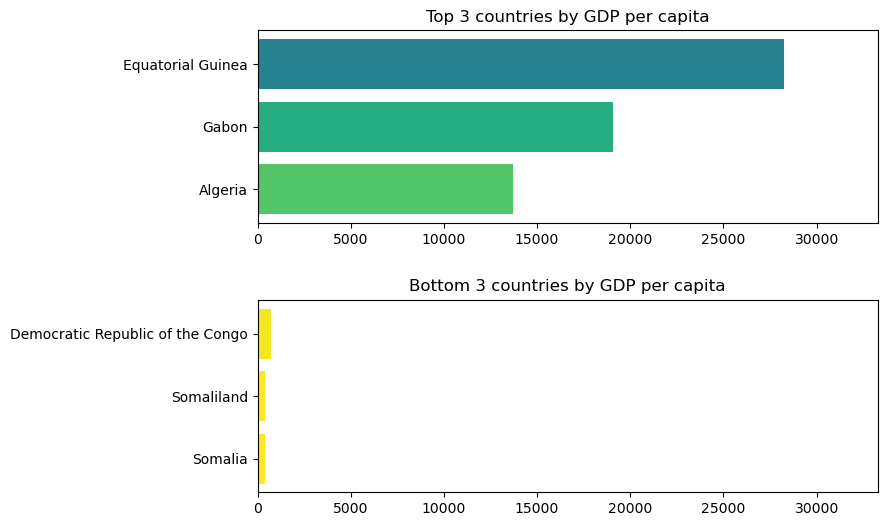

In [57]:
import matplotlib.cm as cm


grouped_gdp = gdf_gdp.groupby('country').mean('gdp').sort_values('gdp', ascending = True).reset_index()
# Get colormap for bar plot
colors = cm.get_cmap('viridis_r')(grouped_gdp['gdp'] / gdf_gdp['gdp'].max())


top_bottom_gdp = pd.concat([grouped_gdp.head(3), grouped_gdp.tail(3)])

# Set the figure size
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))

# Plot the top 3 countries
axs[1].barh(top_bottom_gdp.iloc[:3]['country'], top_bottom_gdp.iloc[:3]['gdp'], color=colors[:3])
axs[1].set_xlim(0, top_bottom_gdp['gdp'].max()+5000)
axs[1].set_title('Bottom 3 countries by GDP per capita')

# Plot the bottom 3 countries
axs[0].barh(top_bottom_gdp.iloc[-3:]['country'], top_bottom_gdp.iloc[-3:]['gdp'], color=colors[-3:])
axs[0].set_xlim(0, top_bottom_gdp['gdp'].max()+5000)
axs[0].set_title('Top 3 countries by GDP per capita')

# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.4)

#### Population

In [59]:
href_pop = catalog.get_child("world_pop").assets["data"].href
ds_pop = xr.open_zarr(href_pop)

In [60]:
continent = b'Africa'
indices = np.where(ds_pop['continent'].values == continent)[0]

df_pop = ds_pop.isel(stations = indices).to_dataframe()
change_cols = ['continent', 'country', 'transect_id']
for cc in change_cols:
    df_pop[cc] = df_pop[cc].str.decode("utf-8")

df_pop['transect_geom'] = df_pop['transect_geom'].apply(wkt.loads)
gdf_pop = gpd.GeoDataFrame(df_pop, geometry='transect_geom')

gdf_pop.head(2)

,continent,country,lat,lon,pop_10_m,pop_1_m,pop_5_m,pop_tot,transect_geom,transect_id
stations,,,,,,,,,,
0,Africa,South Africa,-34.514447,19.378821,0.0,0.0,0.0,2.846119,"LINESTRING (19.37882 -34.51445, 19.36877 -34.5...",BOX_056_011_0
1,Africa,South Africa,-34.516645,19.380017,0.0,0.0,0.0,2.846119,"LINESTRING (19.38002 -34.51665, 19.36935 -34.5...",BOX_056_011_1


In [61]:
gdf_pop = gdf_pop.sort_values(by = 'pop_tot')

In [62]:
fig = px.scatter_mapbox(gdf_pop, 
                    lat='lat', 
                    lon = 'lon',
                    color='pop_tot', 
                    center={'lat':gdf_gdp['lat'].mean(), 'lon':gdf_gdp['lon'].mean()},
                    color_continuous_scale = 'Viridis_r',
                    mapbox_style='carto-positron', 
                    zoom=2.5,
                    width = 800,
                    height = 1000)
fig.show()

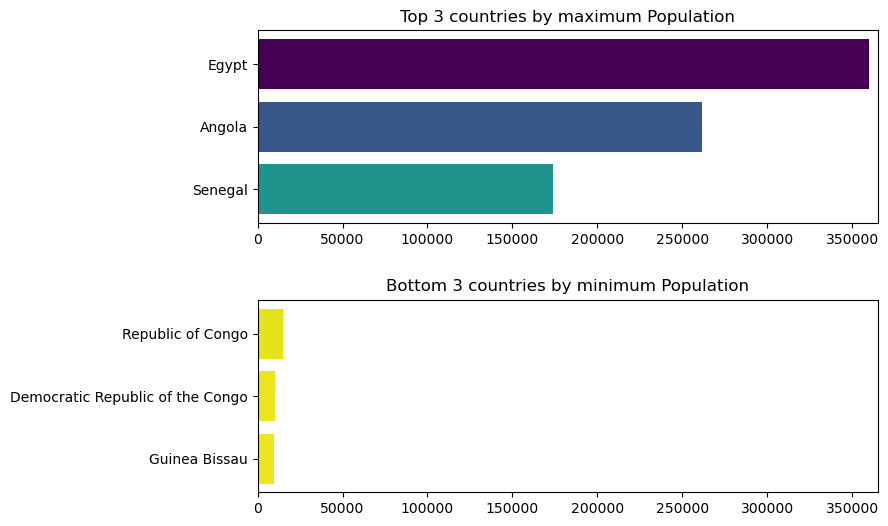

In [69]:
import matplotlib.cm as cm


grouped_gdp = gdf_pop.groupby('country').max('pop_tot').sort_values('pop_tot', ascending = True).reset_index()
# Get colormap for bar plot
colors = cm.get_cmap('viridis_r')(grouped_gdp['pop_tot'] / gdf_pop['pop_tot'].max())


top_bottom_gdp = pd.concat([grouped_gdp.head(3), grouped_gdp.tail(3)])

# Set the figure size
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(8, 6))

# Plot the top 3 countries
axs[1].barh(top_bottom_gdp.iloc[:3]['country'], top_bottom_gdp.iloc[:3]['pop_tot'], color=colors[:3])
axs[1].set_xlim(0, top_bottom_gdp['pop_tot'].max()+5000)
axs[1].set_title('Bottom 3 countries by minimum Population')

# Plot the bottom 3 countries
axs[0].barh(top_bottom_gdp.iloc[-3:]['country'], top_bottom_gdp.iloc[-3:]['pop_tot'], color=colors[-3:])
axs[0].set_xlim(0, top_bottom_gdp['pop_tot'].max()+5000)
axs[0].set_title('Top 3 countries by maximum Population')

# Adjust the spacing between the subplots
fig.subplots_adjust(hspace=0.4)